In [1]:
import sys
sys.path.append('../')

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, balanced_accuracy_score, roc_auc_score
from utils import load_data, feature_selection, plot_graphs, preprocessing
from imblearn.over_sampling import SMOTE, KMeansSMOTE
from models import train
import pyswarms as ps
from pyswarms.discrete.binary import BinaryPSO
import matplotlib.pyplot as plt
from pyswarms.utils.plotters import plot_contour, plot_surface
from pyswarms.utils.plotters.formatters import Designer
from pyswarms.utils.plotters.formatters import Mesher
import pygad
import optuna
from optuna.samplers import TPESampler, CmaEsSampler
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice
from catboost import CatBoostClassifier, Pool
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [2]:
def fit_model_f1(model, X_train, X_test, y_train, y_test):

    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    f1 = f1_score(y_test, pred)

    return f1
    

def fit_model_no_train_test(model, X_train, X_test, y_train, y_test, method):

    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    print('ACCURACY:', round(accuracy_score(y_test, pred), 3))
    print('BALANCED ACCURACY', round(balanced_accuracy_score(y_test, pred), 3))
    print('F-SCORE:', round(f1_score(y_test, pred), 3))
    print('PRECISION:', round(precision_score(y_test, pred), 3))
    print('RECALL:', round(recall_score(y_test, pred), 3))
    print('AUC ROC:', round(roc_auc_score(y_test, pred), 3))

    df_metrics = pd.DataFrame(index=['ACCURACY', 'BALANCED ACCURACY', 
        'F-SCORE', 'PRECISION', 'RECALL', 'AUC ROC'], data={method: [round(accuracy_score(y_test, pred), 3), 
                                                                    round(balanced_accuracy_score(y_test, pred), 3),
                                                                    round(f1_score(y_test, pred), 3),
                                                                    round(precision_score(y_test, pred), 3),
                                                                    round(recall_score(y_test, pred), 3),
                                                                    round(roc_auc_score(y_test, pred), 3)]})
    return model, df_metrics

In [4]:
# DATA RAW

df_train = pd.read_excel('treinamento-raw.xlsx').set_index('Sample')
X_train = df_train.drop(['y'], axis=1)
y_train = df_train['y'].to_numpy()
df_train = X_train.copy()
df_train['y'] = y_train

df_test = pd.read_excel('teste-raw.xlsx').set_index('Sample')
X_test = df_test.drop(['y'], axis=1)
y_test = df_test['y'].to_numpy()
df_test = X_test.copy()
df_test['y'] = y_test

X_train_array = X_train.copy()
X_test_array = X_test.copy()

# SNV
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

# GENERATE FEATURES DATASET
X_features_train = preprocessing.create_features(
        X_snv_train, n_subsets=26, mode='stats')
X_features_train.to_excel('treinamento-raw-features.xlsx')

X_features_test = preprocessing.create_features(
        X_snv_test, n_subsets=26, mode='stats')
X_features_test.to_excel('teste-features.xlsx')


print(X_snv_train.shape, X_snv_test.shape)
print(X_features_train.shape, X_features_test.shape)
# print(y_train.shape, y_test.shape)

(535, 125) (179, 125)
(535, 312) (179, 312)


In [9]:
# DATA SMOTE

df_train = pd.read_excel('treinamento-smote.xlsx', index_col=0)
X_train = df_train.drop(['y'], axis=1)
y_train = df_train['y'].to_numpy()
df_train = X_train.copy()
df_train['y'] = y_train

df_test = pd.read_excel('teste-smote.xlsx', index_col=0)
X_test = df_test.drop(['y'], axis=1)
y_test = df_test['y'].to_numpy()
df_test = X_test.copy()
df_test['y'] = y_test

X_train_array = X_train.copy()
X_test_array = X_test.copy()

# SNV
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

# GENERATE FEATURES DATASET
X_features_train = preprocessing.create_features(
        X_snv_train, n_subsets=26, mode='stats')
X_features_train.to_excel('treinamento-smote-features.xlsx')

X_features_test = preprocessing.create_features(
        X_snv_test, n_subsets=26, mode='stats')
X_features_test.to_excel('teste-features.xlsx')

print(X_snv_train.shape, X_snv_test.shape)
print(X_features_train.shape)
# print(y_train.shape, y_test.shape)

(768, 125) (179, 125)
(768, 312)


In [8]:
# DATA PCA

df_train = pd.read_excel('treinamento-pca.xlsx', index_col=0)
X_train = df_train.drop(['y'], axis=1)
y_train = df_train['y'].to_numpy()
df_train = X_train.copy()
df_train['y'] = y_train

df_test = pd.read_excel('teste-raw.xlsx', index_col=0)
X_test = df_test.drop(['y'], axis=1)
y_test = df_test['y'].to_numpy()
df_test = X_test.copy()
df_test['y'] = y_test

# # SNV + Features
# X_snv_train = X_train
# X_snv_test = X_test
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

# GENERATE FEATURES DATASET
X_features_train = preprocessing.create_features(
        X_snv_train, n_subsets=26, mode='stats')
X_features_train.to_excel('treinamento-pca-features.xlsx')

print(X_snv_train.shape, X_snv_test.shape)
print(X_features_train.shape)
# print(y_train.shape, y_test.shape)

(768, 125) (179, 125)
(768, 312)


#### Optuna for binary classification - XGBoost

In [6]:
# NO PREPROCESSING

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        "objective": "binary:logistic",
        "eval_metric": "auc",
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 25),
        'max_depth': trial.suggest_int('max_depth', 1, 15, step=1),
        'n_estimators': trial.suggest_int('n_estimators', 10, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'subsample': trial.suggest_float('subsample', 0.1, 1),
        'reg_alpha': trial.suggest_int('reg_alpha', 0, 20, step=1),
        'reg_lambda': trial.suggest_int('reg_lambda', 0, 20, step=1)
    }

    model = XGBClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_train_array, X_test_array, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "scale_pos_weight": trial.params['scale_pos_weight'],
    "max_depth": trial.params['max_depth'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "colsample_bytree": trial.params['colsample_bytree'],
    "subsample": trial.params['subsample'],
    "reg_alpha": trial.params['reg_alpha'],
    "reg_lambda": trial.params['reg_lambda']
    }

model = XGBClassifier(**params)

model, df_metrics_xgboost = fit_model_no_train_test(model, 
    X_train_array, X_test_array, y_train, y_test, 'xgboost')

df_metrics_xgboost

[I 2023-02-02 13:37:20,641] A new study created in memory with name: no-name-05b022e6-b948-4288-90ba-50f2e8548fc1
[I 2023-02-02 13:37:20,821] Trial 0 finished with value: 0.4519231769230769 and parameters: {'scale_pos_weight': 16, 'max_depth': 7, 'n_estimators': 23, 'learning_rate': 0.9330737773776723, 'colsample_bytree': 0.5309326754858048, 'subsample': 0.18019878429014263, 'reg_alpha': 17, 'reg_lambda': 7}. Best is trial 0 with value: 0.4519231769230769.
[I 2023-02-02 13:37:21,336] Trial 1 finished with value: 0.4822696035460993 and parameters: {'scale_pos_weight': 20, 'max_depth': 3, 'n_estimators': 70, 'learning_rate': 0.9337112576809571, 'colsample_bytree': 0.9344684442373066, 'subsample': 0.7177350957665948, 'reg_alpha': 5, 'reg_lambda': 5}. Best is trial 1 with value: 0.4822696035460993.
[I 2023-02-02 13:37:21,702] Trial 2 finished with value: 0.46153856153846157 and parameters: {'scale_pos_weight': 21, 'max_depth': 7, 'n_estimators': 53, 'learning_rate': 0.16550074624577427, 'c

Number of finished trials: 200
Best trial:
Value: 0.5714286714285713
Params: 
scale_pos_weight: 1
max_depth: 10
n_estimators: 28
learning_rate: 0.5148492032224444
colsample_bytree: 0.5814429829593172
subsample: 0.2869413376773204
reg_alpha: 3
reg_lambda: 12
ACCURACY: 0.732
BALANCED ACCURACY 0.7
F-SCORE: 0.571
PRECISION: 0.525
RECALL: 0.627
AUC ROC: 0.7


,xgboost
ACCURACY,0.732
BALANCED ACCURACY,0.700
F-SCORE,0.571
PRECISION,0.525
RECALL,0.627
AUC ROC,0.700


In [7]:
# SNV

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        "objective": "binary:logistic",
        "eval_metric": "auc",
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 25),
        'max_depth': trial.suggest_int('max_depth', 1, 15, step=1),
        'n_estimators': trial.suggest_int('n_estimators', 10, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'subsample': trial.suggest_float('subsample', 0.1, 1),
        'reg_alpha': trial.suggest_int('reg_alpha', 0, 20, step=1),
        'reg_lambda': trial.suggest_int('reg_lambda', 0, 20, step=1)
    }

    model = XGBClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_snv_train, X_snv_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "scale_pos_weight": trial.params['scale_pos_weight'],
    "max_depth": trial.params['max_depth'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "colsample_bytree": trial.params['colsample_bytree'],
    "subsample": trial.params['subsample'],
    "reg_alpha": trial.params['reg_alpha'],
    "reg_lambda": trial.params['reg_lambda']
    }

model = XGBClassifier(**params)

model, df_metrics_xgboost = fit_model_no_train_test(model, 
    X_snv_train, X_snv_test, y_train, y_test, 'xgboost')

df_metrics_xgboost

[I 2023-02-02 13:39:32,842] A new study created in memory with name: no-name-10851a37-3fd4-4013-af9c-abe78c1443a4
[I 2023-02-02 13:39:34,239] Trial 0 finished with value: 0.5695365238410596 and parameters: {'scale_pos_weight': 5, 'max_depth': 7, 'n_estimators': 27, 'learning_rate': 0.46722656205439755, 'colsample_bytree': 0.6256134196101217, 'subsample': 0.7289974895163904, 'reg_alpha': 6, 'reg_lambda': 20}. Best is trial 0 with value: 0.5695365238410596.
[I 2023-02-02 13:39:35,897] Trial 1 finished with value: 0.5095542401273885 and parameters: {'scale_pos_weight': 14, 'max_depth': 13, 'n_estimators': 34, 'learning_rate': 0.6934160131252711, 'colsample_bytree': 0.73360841393145, 'subsample': 0.8360472567915659, 'reg_alpha': 12, 'reg_lambda': 14}. Best is trial 0 with value: 0.5695365238410596.
[I 2023-02-02 13:39:36,526] Trial 2 finished with value: 0.5061729395061728 and parameters: {'scale_pos_weight': 7, 'max_depth': 1, 'n_estimators': 58, 'learning_rate': 0.8999824981008889, 'cols

Number of finished trials: 200
Best trial:
Value: 0.6231885057971014
Params: 
scale_pos_weight: 7
max_depth: 9
n_estimators: 41
learning_rate: 0.4655863632822025
colsample_bytree: 0.9090776718443805
subsample: 0.7140986885652338
reg_alpha: 6
reg_lambda: 17
ACCURACY: 0.709
BALANCED ACCURACY 0.75
F-SCORE: 0.623
PRECISION: 0.494
RECALL: 0.843
AUC ROC: 0.75


,xgboost
ACCURACY,0.709
BALANCED ACCURACY,0.750
F-SCORE,0.623
PRECISION,0.494
RECALL,0.843
AUC ROC,0.750


In [17]:
# FEATURES

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        "objective": "binary:logistic",
        "eval_metric": "auc",
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 25),
        'max_depth': trial.suggest_int('max_depth', 1, 15, step=1),
        'n_estimators': trial.suggest_int('n_estimators', 10, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'subsample': trial.suggest_float('subsample', 0.1, 1),
        'reg_alpha': trial.suggest_int('reg_alpha', 0, 20, step=1),
        'reg_lambda': trial.suggest_int('reg_lambda', 0, 20, step=1)
    }

    model = XGBClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_features_train, X_features_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=10000)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "scale_pos_weight": trial.params['scale_pos_weight'],
    "max_depth": trial.params['max_depth'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "colsample_bytree": trial.params['colsample_bytree'],
    "subsample": trial.params['subsample'],
    "reg_alpha": trial.params['reg_alpha'],
    "reg_lambda": trial.params['reg_lambda']
    }

model = XGBClassifier(**params)

model, df_metrics_xgboost = fit_model_no_train_test(model, 
    X_features_train, X_features_test, y_train, y_test, 'xgboost')

df_metrics_xgboost

[I 2023-02-02 23:13:13,427] A new study created in memory with name: no-name-2e6a3cc7-21e1-437d-825e-94b9b5581c8e
[I 2023-02-02 23:13:14,075] Trial 0 finished with value: 0.5733334333333333 and parameters: {'scale_pos_weight': 16, 'max_depth': 1, 'n_estimators': 85, 'learning_rate': 0.7180841799379062, 'colsample_bytree': 0.6733856472649564, 'subsample': 0.4101048559903089, 'reg_alpha': 9, 'reg_lambda': 2}. Best is trial 0 with value: 0.5733334333333333.
[I 2023-02-02 23:13:14,406] Trial 1 finished with value: 0.5245902639344262 and parameters: {'scale_pos_weight': 25, 'max_depth': 3, 'n_estimators': 34, 'learning_rate': 0.19221032665988944, 'colsample_bytree': 0.8007674498524684, 'subsample': 0.6552199504218625, 'reg_alpha': 17, 'reg_lambda': 4}. Best is trial 0 with value: 0.5733334333333333.
[I 2023-02-02 23:13:15,689] Trial 2 finished with value: 0.5573771491803278 and parameters: {'scale_pos_weight': 22, 'max_depth': 12, 'n_estimators': 46, 'learning_rate': 0.9879780743965619, 'co

Number of finished trials: 10000
Best trial:
Value: 0.7500000999999998
Params: 
scale_pos_weight: 1
max_depth: 5
n_estimators: 75
learning_rate: 0.7501892016398936
colsample_bytree: 0.9140549954286079
subsample: 0.5147950329817099
reg_alpha: 16
reg_lambda: 20
ACCURACY: 0.844
BALANCED ACCURACY 0.838
F-SCORE: 0.75
PRECISION: 0.689
RECALL: 0.824
AUC ROC: 0.838


,xgboost
ACCURACY,0.844
BALANCED ACCURACY,0.838
F-SCORE,0.750
PRECISION,0.689
RECALL,0.824
AUC ROC,0.838


In [18]:
model.save_model("model_features_xgboost.json")

#### Optuna for binary classification - Catboost

In [11]:
# NO PREPROCESSING

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'verbose': 0,
        'random_seed': 1066,
        # 'boosting_type': trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        # 'objective': trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
        'max_depth': trial.suggest_int('max_depth', 1, 16), 
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 1, 40),
        'n_estimators': trial.suggest_int('n_estimators', 1, 200),
        'rsm': trial.suggest_float('rsm', 0.1, 1.0),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1)
    }

    model = CatBoostClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_train_array, X_test_array, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
        'verbose': 0,
        'random_seed': 1066,
        'max_depth': trial.params['max_depth'], 
        'l2_leaf_reg': trial.params['l2_leaf_reg'],
        'n_estimators': trial.params['n_estimators'],
        'rsm': trial.params['rsm'],
        'learning_rate': trial.params['learning_rate']
    }

model = CatBoostClassifier(**params)

model, df_metrics = fit_model_no_train_test(model, 
    X_train_array, X_test_array, y_train, y_test, 'catboost')

df_metrics

[I 2023-02-02 13:54:37,754] A new study created in memory with name: no-name-f3f1d23b-836c-4037-a7b0-02cb2328aefe
[I 2023-02-02 13:56:05,853] Trial 0 finished with value: 0.49090919090909096 and parameters: {'max_depth': 15, 'l2_leaf_reg': 11, 'n_estimators': 40, 'rsm': 0.48666177403151756, 'learning_rate': 0.07115959150974464}. Best is trial 0 with value: 0.49090919090909096.
[I 2023-02-02 13:56:07,517] Trial 1 finished with value: 0.45544564455445546 and parameters: {'max_depth': 8, 'l2_leaf_reg': 11, 'n_estimators': 43, 'rsm': 0.366916833598696, 'learning_rate': 0.5000038715614735}. Best is trial 0 with value: 0.49090919090909096.
[I 2023-02-02 13:56:54,663] Trial 2 finished with value: 0.537037137037037 and parameters: {'max_depth': 12, 'l2_leaf_reg': 14, 'n_estimators': 174, 'rsm': 0.5677586879633963, 'learning_rate': 0.021815687904837545}. Best is trial 2 with value: 0.537037137037037.
[I 2023-02-02 13:56:55,277] Trial 3 finished with value: 0.49019617843137253 and parameters: {'

Number of finished trials: 200
Best trial:
Value: 0.5840708964601771
Params: 
max_depth: 1
l2_leaf_reg: 36
n_estimators: 175
rsm: 0.7373256334332423
learning_rate: 0.3474759760262237
ACCURACY: 0.737
BALANCED ACCURACY 0.71
F-SCORE: 0.584
PRECISION: 0.532
RECALL: 0.647
AUC ROC: 0.71


,catboost
ACCURACY,0.737
BALANCED ACCURACY,0.710
F-SCORE,0.584
PRECISION,0.532
RECALL,0.647
AUC ROC,0.710


In [12]:
# SNV

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'verbose': 0,
        'random_seed': 1066,
        # 'boosting_type': trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        # 'objective': trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
        'max_depth': trial.suggest_int('max_depth', 1, 16), 
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 1, 40),
        'n_estimators': trial.suggest_int('n_estimators', 1, 200),
        'rsm': trial.suggest_float('rsm', 0.1, 1.0),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1)
    }

    model = CatBoostClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_snv_train, X_snv_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
        'verbose': 0,
        'random_seed': 1066,
        'max_depth': trial.params['max_depth'], 
        'l2_leaf_reg': trial.params['l2_leaf_reg'],
        'n_estimators': trial.params['n_estimators'],
        'rsm': trial.params['rsm'],
        'learning_rate': trial.params['learning_rate']
    }

model = CatBoostClassifier(**params)

model, df_metrics = fit_model_no_train_test(model, 
    X_snv_train, X_snv_test, y_train, y_test, 'catboost')

df_metrics

[I 2023-02-02 14:56:52,870] A new study created in memory with name: no-name-169a9e27-8446-48fc-8d85-ab546da270cb
[I 2023-02-02 14:57:14,921] Trial 0 finished with value: 0.47619057619047617 and parameters: {'max_depth': 10, 'l2_leaf_reg': 26, 'n_estimators': 196, 'rsm': 0.9965094281816956, 'learning_rate': 0.6365038981323944}. Best is trial 0 with value: 0.47619057619047617.
[I 2023-02-02 14:57:16,168] Trial 1 finished with value: 0.5769231769230769 and parameters: {'max_depth': 5, 'l2_leaf_reg': 36, 'n_estimators': 121, 'rsm': 0.6477862246473679, 'learning_rate': 0.9909969957781567}. Best is trial 1 with value: 0.5769231769230769.
[I 2023-02-02 14:57:22,899] Trial 2 finished with value: 0.5252526252525253 and parameters: {'max_depth': 8, 'l2_leaf_reg': 37, 'n_estimators': 167, 'rsm': 0.3168245915584116, 'learning_rate': 0.25442198190476656}. Best is trial 1 with value: 0.5769231769230769.
[I 2023-02-02 14:57:26,341] Trial 3 finished with value: 0.5283019867924528 and parameters: {'ma

Number of finished trials: 200
Best trial:
Value: 0.6422019348623853
Params: 
max_depth: 1
l2_leaf_reg: 38
n_estimators: 52
rsm: 0.39691690853697287
learning_rate: 0.28250873691057415
ACCURACY: 0.782
BALANCED ACCURACY 0.753
F-SCORE: 0.642
PRECISION: 0.603
RECALL: 0.686
AUC ROC: 0.753


,catboost
ACCURACY,0.782
BALANCED ACCURACY,0.753
F-SCORE,0.642
PRECISION,0.603
RECALL,0.686
AUC ROC,0.753


In [13]:
# FEATURES

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'verbose': 0,
        'random_seed': 1066,
        # 'boosting_type': trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        # 'objective': trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
        'max_depth': trial.suggest_int('max_depth', 1, 16), 
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 1, 40),
        'n_estimators': trial.suggest_int('n_estimators', 1, 200),
        'rsm': trial.suggest_float('rsm', 0.1, 1.0),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1)
    }

    model = CatBoostClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_features_train, X_features_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
        'verbose': 0,
        'random_seed': 1066,
        'max_depth': trial.params['max_depth'], 
        'l2_leaf_reg': trial.params['l2_leaf_reg'],
        'n_estimators': trial.params['n_estimators'],
        'rsm': trial.params['rsm'],
        'learning_rate': trial.params['learning_rate']
    }

model = CatBoostClassifier(**params)

model, df_metrics = fit_model_no_train_test(model, 
    X_features_train, X_features_test, y_train, y_test, 'catboost')

df_metrics

[I 2023-02-02 15:13:51,430] A new study created in memory with name: no-name-c5b16e47-9b9b-4b36-a0ef-336749d0097a
[I 2023-02-02 15:24:55,584] Trial 0 finished with value: 0.6000000999999999 and parameters: {'max_depth': 15, 'l2_leaf_reg': 28, 'n_estimators': 93, 'rsm': 0.5794431979036861, 'learning_rate': 0.22814747199394855}. Best is trial 0 with value: 0.6000000999999999.
[I 2023-02-02 15:25:04,749] Trial 1 finished with value: 0.5436894203883494 and parameters: {'max_depth': 6, 'l2_leaf_reg': 1, 'n_estimators': 165, 'rsm': 0.42286133403473436, 'learning_rate': 0.9232105893193264}. Best is trial 0 with value: 0.6000000999999999.
[I 2023-02-02 15:25:05,343] Trial 2 finished with value: 0.5785124966942148 and parameters: {'max_depth': 9, 'l2_leaf_reg': 12, 'n_estimators': 2, 'rsm': 0.5875203511585771, 'learning_rate': 0.520392891451597}. Best is trial 0 with value: 0.6000000999999999.
[I 2023-02-02 15:25:10,429] Trial 3 finished with value: 0.6181819181818181 and parameters: {'max_dept

Number of finished trials: 200
Best trial:
Value: 0.6862746098039215
Params: 
max_depth: 9
l2_leaf_reg: 37
n_estimators: 170
rsm: 0.41225866749965256
learning_rate: 0.1831096738555698
ACCURACY: 0.821
BALANCED ACCURACY 0.781
F-SCORE: 0.686
PRECISION: 0.686
RECALL: 0.686
AUC ROC: 0.781


,catboost
ACCURACY,0.821
BALANCED ACCURACY,0.781
F-SCORE,0.686
PRECISION,0.686
RECALL,0.686
AUC ROC,0.781


#### Optuna optimization - LGBM

In [14]:
# NO PREPROCESSING

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 15),
        "n_estimators": trial.suggest_int('n_estimators', 10, 100),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 1),
        "num_leaves": trial.suggest_int("num_leaves", 20, 5000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        # "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        # "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        # "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        # "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        # "bagging_fraction": trial.suggest_float(
        #     "bagging_fraction", 0.2, 0.95, step=0.1
        # ),
        # "feature_fraction": trial.suggest_float(
        #     "feature_fraction", 0.2, 0.95, step=0.1
        # ),
    }

    model = LGBMClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_train_array, X_test_array, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    'scale_pos_weight': trial.params['scale_pos_weight'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "num_leaves": trial.params['num_leaves'],
    "max_depth": trial.params['max_depth']
    }

model = LGBMClassifier(**params)

model, df_metrics = fit_model_no_train_test(model, 
    X_train_array, X_test_array, y_train, y_test, 'lgbm')

df_metrics

[I 2023-02-02 19:16:52,047] A new study created in memory with name: no-name-52cd534a-94d8-417a-9e1d-05e82b6d8ae2
[I 2023-02-02 19:16:53,816] Trial 0 finished with value: 0.4778762061946903 and parameters: {'scale_pos_weight': 14, 'n_estimators': 70, 'learning_rate': 0.4335239956409133, 'num_leaves': 3500, 'max_depth': 11}. Best is trial 0 with value: 0.4778762061946903.
[I 2023-02-02 19:16:54,020] Trial 1 finished with value: 0.47706432018348627 and parameters: {'scale_pos_weight': 5, 'n_estimators': 69, 'learning_rate': 0.4095042633626889, 'num_leaves': 3780, 'max_depth': 10}. Best is trial 0 with value: 0.4778762061946903.
[I 2023-02-02 19:16:54,070] Trial 2 finished with value: 0.4897960183673469 and parameters: {'scale_pos_weight': 5, 'n_estimators': 16, 'learning_rate': 0.16447790749867797, 'num_leaves': 500, 'max_depth': 6}. Best is trial 2 with value: 0.4897960183673469.
[I 2023-02-02 19:16:54,863] Trial 3 finished with value: 0.47863257863247866 and parameters: {'scale_pos_wei

Number of finished trials: 200
Best trial:
Value: 0.5616439356164383
Params: 
scale_pos_weight: 12
n_estimators: 61
learning_rate: 0.20190493773331575
num_leaves: 1400
max_depth: 4
ACCURACY: 0.642
BALANCED ACCURACY 0.691
F-SCORE: 0.562
PRECISION: 0.432
RECALL: 0.804
AUC ROC: 0.691


,lgbm
ACCURACY,0.642
BALANCED ACCURACY,0.691
F-SCORE,0.562
PRECISION,0.432
RECALL,0.804
AUC ROC,0.691


In [15]:
# SNV

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 15),
        "n_estimators": trial.suggest_int('n_estimators', 10, 100),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 1),
        "num_leaves": trial.suggest_int("num_leaves", 20, 5000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        # "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        # "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        # "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        # "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        # "bagging_fraction": trial.suggest_float(
        #     "bagging_fraction", 0.2, 0.95, step=0.1
        # ),
        # "feature_fraction": trial.suggest_float(
        #     "feature_fraction", 0.2, 0.95, step=0.1
        # ),
    }

    model = LGBMClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_snv_train, X_snv_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    'scale_pos_weight': trial.params['scale_pos_weight'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "num_leaves": trial.params['num_leaves'],
    "max_depth": trial.params['max_depth']
    }

model = LGBMClassifier(**params)

model, df_metrics = fit_model_no_train_test(model, 
    X_snv_train, X_snv_test, y_train, y_test, 'lgbm')

df_metrics

[I 2023-02-02 19:17:53,040] A new study created in memory with name: no-name-86cf9bf4-f6d0-455c-82f0-eedb25bd3c8e
[I 2023-02-02 19:17:53,329] Trial 0 finished with value: 0.5714286714285712 and parameters: {'scale_pos_weight': 12, 'n_estimators': 20, 'learning_rate': 0.45276128156573253, 'num_leaves': 2800, 'max_depth': 9}. Best is trial 0 with value: 0.5714286714285712.
[I 2023-02-02 19:17:53,462] Trial 1 finished with value: 0.5217392304347825 and parameters: {'scale_pos_weight': 6, 'n_estimators': 31, 'learning_rate': 0.5414686086788878, 'num_leaves': 120, 'max_depth': 5}. Best is trial 0 with value: 0.5714286714285712.
[I 2023-02-02 19:17:53,830] Trial 2 finished with value: 0.5309735513274336 and parameters: {'scale_pos_weight': 12, 'n_estimators': 86, 'learning_rate': 0.5223365936908968, 'num_leaves': 4840, 'max_depth': 10}. Best is trial 0 with value: 0.5714286714285712.
[I 2023-02-02 19:17:54,462] Trial 3 finished with value: 0.49523819523809526 and parameters: {'scale_pos_weig

Number of finished trials: 200
Best trial:
Value: 0.6218488394957983
Params: 
scale_pos_weight: 10
n_estimators: 24
learning_rate: 0.47187060186570984
num_leaves: 960
max_depth: 9
ACCURACY: 0.749
BALANCED ACCURACY 0.742
F-SCORE: 0.622
PRECISION: 0.544
RECALL: 0.725
AUC ROC: 0.742


,lgbm
ACCURACY,0.749
BALANCED ACCURACY,0.742
F-SCORE,0.622
PRECISION,0.544
RECALL,0.725
AUC ROC,0.742


In [19]:
# FEATURES

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 15),
        "n_estimators": trial.suggest_int('n_estimators', 10, 100),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 1),
        "num_leaves": trial.suggest_int("num_leaves", 20, 5000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        # "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        # "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        # "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        # "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        # "bagging_fraction": trial.suggest_float(
        #     "bagging_fraction", 0.2, 0.95, step=0.1
        # ),
        # "feature_fraction": trial.suggest_float(
        #     "feature_fraction", 0.2, 0.95, step=0.1
        # ),
    }

    model = LGBMClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_features_train, X_features_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=10000)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    'scale_pos_weight': trial.params['scale_pos_weight'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "num_leaves": trial.params['num_leaves'],
    "max_depth": trial.params['max_depth']
    }

model_lgbm = LGBMClassifier(**params)

model_lgbm, df_metrics = fit_model_no_train_test(model_lgbm, 
    X_features_train, X_features_test, y_train, y_test, 'lgbm')

df_metrics

[I 2023-02-03 14:08:08,200] A new study created in memory with name: no-name-227cea55-bf85-4a89-a41f-a6ce5995d499
[I 2023-02-03 14:08:14,237] Trial 0 finished with value: 0.6055046871559633 and parameters: {'scale_pos_weight': 13, 'n_estimators': 52, 'learning_rate': 0.5183924413201009, 'num_leaves': 4660, 'max_depth': 5}. Best is trial 0 with value: 0.6055046871559633.
[I 2023-02-03 14:08:21,618] Trial 1 finished with value: 0.6470589235294117 and parameters: {'scale_pos_weight': 6, 'n_estimators': 73, 'learning_rate': 0.5688097468816006, 'num_leaves': 4900, 'max_depth': 6}. Best is trial 1 with value: 0.6470589235294117.
[I 2023-02-03 14:08:33,436] Trial 2 finished with value: 0.588235394117647 and parameters: {'scale_pos_weight': 9, 'n_estimators': 67, 'learning_rate': 0.5821094845368926, 'num_leaves': 860, 'max_depth': 6}. Best is trial 1 with value: 0.6470589235294117.
[I 2023-02-03 14:08:34,674] Trial 3 finished with value: 0.5393259426966291 and parameters: {'scale_pos_weight': 

Number of finished trials: 10000
Best trial:
Value: 0.7428572428571427
Params: 
scale_pos_weight: 1
n_estimators: 94
learning_rate: 0.07413532971822273
num_leaves: 3380
max_depth: 3
ACCURACY: 0.849
BALANCED ACCURACY 0.824
F-SCORE: 0.743
PRECISION: 0.722
RECALL: 0.765
AUC ROC: 0.824


,lgbm
ACCURACY,0.849
BALANCED ACCURACY,0.824
F-SCORE,0.743
PRECISION,0.722
RECALL,0.765
AUC ROC,0.824


#### Plots

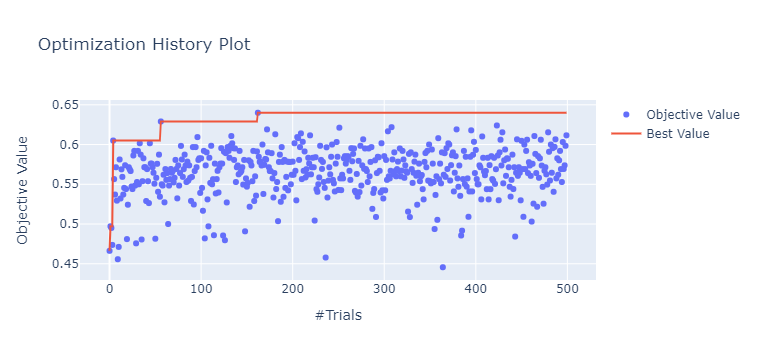

In [8]:
plot_optimization_history(study)

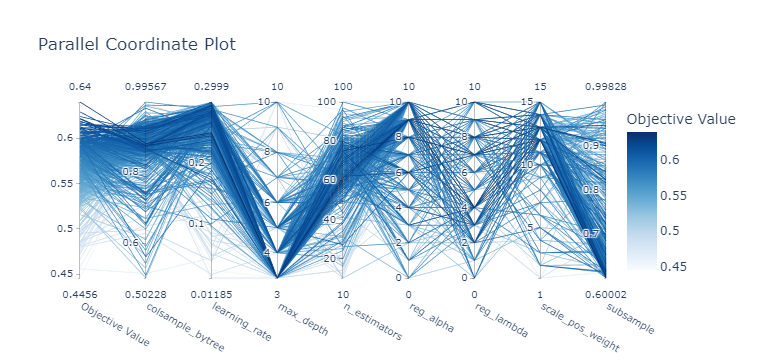

In [9]:
plot_parallel_coordinate(study)

In [10]:
# plot_contour(study)

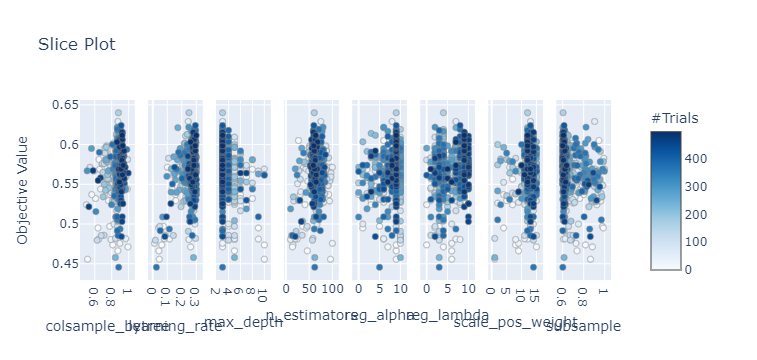

In [11]:
plot_slice(study)

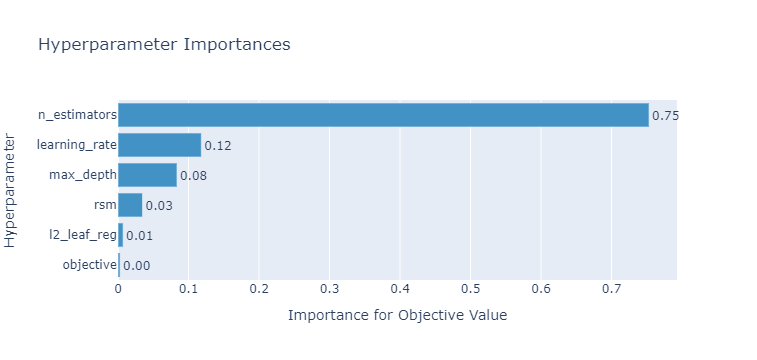

In [35]:
plot_param_importances(study)

#### Shap Feature Selection

In [ ]:
# feature selection
import shap

def build_model(df, target, params):
    """
    Given the dataframe and target, build and return the model
    """
    y = df[target]

    X = df.drop(columns=[target])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=1066)

    train_pool = Pool(X_train, y_train)
    test_pool = Pool(X_test, y_test)

    model = CatBoostClassifier(**params)
    model.fit(X_train, y_train, eval_set=test_pool, use_best_model=True, early_stopping_rounds=10)
    f1 = f1_score(y_test, model.predict(X_test))
    acc = accuracy_score(y_test, model.predict(X_test))
    return f1, acc, model, X_test


def get_dropped_feature(model, X_test):
    explainer = shap.Explainer(model)
    shap_values = explainer(X_test)
    feature_importance = shap_values.abs.mean(0).values
    importance_df = pd.DataFrame({'features': X_test.columns,
                                  'importance': feature_importance})
    importance_df.sort_values(by='importance', ascending=False, inplace=True)
    return importance_df['features'].iloc[-1]
    

def backward_selection(df, target, params, max_features=None):
    """
    This function uses the SHAP importance from a catboost model
    to incrementally remove features from the training set until the RMSE no longer improves.
    This function returns the dataframe with the features that give the best RMSE.
    Return at most max_features.
    """
    # get baseline f1
    select_df = df.copy()
    total_features = df.shape[1]
    f1, acc, model, X_test = build_model(select_df, target, params)
    print(f"{f1} with {select_df.shape[1]}")
    last_f1 = f1
    
    # Drop least important feature and recalculate model peformance
    if max_features is None:
        max_features = total_features-1
        
    for num_features in range(total_features-1, 1, -1):
        # Trim features
        dropped_feature = get_dropped_feature(model, X_test)
        tmp_df = select_df.drop(columns=[dropped_feature])

        # Rerun modeling
        f1, acc, model, X_test = build_model(tmp_df, target, params)
        print(f"{f1} with {tmp_df.shape[1]}")
        if (num_features < max_features) and (f1 > last_f1):
            # RMSE increased, return last dataframe
            return select_df
        else:
            # RMSE improved, continue dropping features
            last_f1 = f1
            select_df = tmp_df
    return select_df

In [ ]:
params = {
        'boosting_type': 'Plain',
        'objective': 'Logloss',
        'verbose': 0,
        'used_ram_limit': '5gb',
        'random_seed': 1066
    }

X_preprocess = pd.DataFrame(preprocessing.SNV(X), columns=X.columns)
df_features = preprocessing.create_features(X_preprocess, n_subsets=28, mode='stats')
df_features['maligno'] = y
reduced_df = backward_selection(df_features, 'maligno', params, max_features=100)
f1, acc, _, _ = build_model(reduced_df, 'maligno', params)
print('f1:', f1, 'acc:', acc)

0.9253731343283583 with 191
0.9242424242424244 with 190
0.9333333333333335 with 189
0.9253731343283583 with 188
0.9333333333333335 with 187
0.9253731343283583 with 186
0.9333333333333335 with 185
0.9323308270676691 with 184
0.9253731343283583 with 183
0.9333333333333335 with 182
0.9323308270676691 with 181
0.9185185185185185 with 180
0.9402985074626866 with 179
0.9402985074626866 with 178
0.9402985074626866 with 177
0.9402985074626866 with 176
0.9264705882352942 with 175
0.9333333333333335 with 174
0.9333333333333335 with 173
0.9402985074626866 with 172
0.9323308270676691 with 171
0.9333333333333335 with 170
0.9402985074626866 with 169
0.9323308270676691 with 168
0.9333333333333335 with 167
0.9333333333333335 with 166
0.9402985074626866 with 165
0.9253731343283583 with 164
0.9185185185185185 with 163
0.9323308270676691 with 162
0.9253731343283583 with 161
0.9333333333333335 with 160
0.9333333333333335 with 159
0.9264705882352942 with 158
0.9090909090909091 with 157
0.9117647058823528 w

#### PSO

In [35]:
def fitness_function_pso(solution):
    global model, X, y
    list_acc = []
    for sol in solution:
        n_subs = int(round(sol[0], 0))
        df_features = preprocessing.create_features_all(X, n_subs)
        X_train, X_test, y_train, y_test = train_test_split(df_features, y, test_size=0.25)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        # score = accuracy_score(y_test, y_pred)
        score = f1_score(y_test, y_pred)
        list_acc.append(1.0 - (score + 0.0000001))
        # usar f-score
    return list_acc

In [36]:
# X = preprocessing.create_features(X_snv, n_subsets=10)
model = train.simple_random_forest()

max_bound = np.array([40])
min_bound = np.array([10])
bounds = (min_bound, max_bound)

options = {'c1': 0.5, 'c2': 0.3, 'w':0.9}
optimizer = ps.single.GlobalBestPSO(n_particles=20, dimensions=1, options=options, bounds=bounds)
cost, pos = optimizer.optimize(fitness_function_pso, iters=10)

2022-06-04 19:48:57,055 - pyswarms.single.global_best - INFO - Optimize for 10 iters with {'c1': 0.5, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|10/10, best_cost=0.0254
2022-06-04 20:05:15,672 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.025380610659898495, best pos: [15.78573091]


#### GA

In [37]:
def fitness_function_ga(solution, solution_idx):
    global model, X, y
    n_subsets = int(round(solution[0], 0))
    df_features = preprocessing.create_features_all(X, n_subsets)
    X_train, X_test, y_train, y_test = train_test_split(df_features, y, test_size=0.25)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    # score = accuracy_score(y_test, y_pred)
    score = f1_score(y_test, y_pred)
    return (score + 0.0000001)


def on_gen(ga_instance):
    generation = ga_instance.generations_completed
    fitness = ga_instance.best_solution(ga_instance.last_generation_fitness)[1]
    print(f"Generation {generation}: Fitness = {round(fitness, 3)}")
    # print("Fitness = {fitness}".format(fitness=ga_instance.best_solution(ga_instance.last_generation_fitness)[1]))

In [38]:
num_parents_mating = 4

sol_per_pop = 8
num_genes = 1
init_range_low = 10
init_range_high = 40

keep_parents = 2
mutation_percent_genes = 10

ga_instance = pygad.GA(num_generations=50,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_function_ga,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=init_range_low,
                       init_range_high=init_range_high,
                       keep_parents=keep_parents,
                       on_generation=on_gen,
                       mutation_percent_genes=mutation_percent_genes)

ga_instance.run()
solution, solution_fitness, solution_idx = ga_instance.best_solution()
print("Parameters of the best solution : {solution}".format(solution=solution))
print("Fitness value of the best solution = {solution_fitness}".format(solution_fitness=solution_fitness))

Generation 1: Fitness = 0.948
Generation 2: Fitness = 0.952
Generation 3: Fitness = 0.952
Generation 4: Fitness = 0.952
Generation 5: Fitness = 0.952
Generation 6: Fitness = 0.952
Generation 7: Fitness = 0.952
Generation 8: Fitness = 0.952
Generation 9: Fitness = 0.964
Generation 10: Fitness = 0.964
Generation 11: Fitness = 0.964
Generation 12: Fitness = 0.964
Generation 13: Fitness = 0.964
Generation 14: Fitness = 0.964
Generation 15: Fitness = 0.964
Generation 16: Fitness = 0.964
Generation 17: Fitness = 0.964
Generation 18: Fitness = 0.964
Generation 19: Fitness = 0.964
Generation 20: Fitness = 0.964
Generation 21: Fitness = 0.964
Generation 22: Fitness = 0.964
Generation 23: Fitness = 0.969
Generation 24: Fitness = 0.969
Generation 25: Fitness = 0.969
Generation 26: Fitness = 0.969
Generation 27: Fitness = 0.969
Generation 28: Fitness = 0.969
Generation 29: Fitness = 0.969
Generation 30: Fitness = 0.969
Generation 31: Fitness = 0.969
Generation 32: Fitness = 0.974
Generation 33: Fi